In [330]:
# Imports
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
from PIL import Image
from sklearn.cluster import KMeans
from tqdm import tqdm
from google.colab import drive

In [331]:
# Mount Drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# Helper functions

In [332]:
def load_image(path):
    """
    Loads an image from the given file path using PIL,
    and returns a NumPy array of shape (height, width, 3).
    """
    img = Image.open(path).convert("RGB")
    return np.array(img)

def save_image(image_np_array, file_path):
    """
    Saves a NumPy array as an image to the specified file path.

    Args:
        image_np_array: NumPy array representing the image.
        file_path: Path to save the image.
    """
    image = Image.fromarray(image_np_array.astype(np.uint8))
    image.save(file_path)

# Plotting

In [333]:
def show_images(original, quantized, title_original="Original", title_quantized="Quantized"):
    """
    Utility to display the original and quantized images side by side.
    """
    fig, axes = plt.subplots(1, 2, figsize=(10, 8))
    axes[0].imshow(original)
    axes[0].set_title(title_original)
    axes[0].axis("off")

    axes[1].imshow(quantized)
    axes[1].set_title(title_quantized)
    axes[1].axis("off")

    plt.tight_layout()
    plt.show()

In [334]:
def image_plotter(image1=None, image2=None, palette1=None, palette2=None,
                                 title1="Original", title2="Quantized"):
    """
    Utility to display the original and quantized images side by side,
    along with their respective color palettes. If any image is None, it is excluded.
    Palettes are still shown even if their corresponding images are None.
    """
    images = [(image1, title1, palette1), (image2, title2, palette2)]
    valid_entries = [(img, title, palette) for img, title, palette in images if img is not None or palette is not None]

    num_columns = len(valid_entries)
    if num_columns == 0:
        print("No images or palettes to display.")
        return

    # Check if any palettes are provided
    has_palettes = any(palette is not None for _, _, palette in valid_entries)

    # Adjust gridspec_kw based on the presence of palettes
    gridspec_kw = {'height_ratios': [5, 1]} if has_palettes else {}  # Remove height_ratios if no palettes
    fig, axes = plt.subplots(2 if has_palettes else 1, num_columns, figsize=(5 * num_columns, 8),
                             gridspec_kw=gridspec_kw)

    if num_columns == 1 and has_palettes:
        axes = np.array([[axes[0]], [axes[1]]])  # Ensure 2D axes for consistency
    elif num_columns == 1 and not has_palettes:
        axes = np.array([axes]) # Ensure 1D if no palettes

    # Plot Images
    for idx, (img, title, _) in enumerate(valid_entries):
        if img is not None:
            axes[0, idx].imshow(img) if has_palettes else axes[idx].imshow(img)  # Access axes correctly
            axes[0, idx].set_title(title, fontsize=12, fontweight='bold') if has_palettes else axes[idx].set_title(title, fontsize=12, fontweight='bold')
            axes[0, idx].axis("off") if has_palettes else axes[idx].axis("off")
        else:
            (axes[0, idx].axis("off") if has_palettes else axes[idx].axis("off"))  # Hide the image subplot if None

    # Plot Palettes (only if they exist)
    if has_palettes:
        for idx, (_, _, palette) in enumerate(valid_entries):
            if palette is not None and palette.shape[0] > 0:
                K = palette.shape[0]
                rect_width = 100 / K  # Fixed width since image might be None
                for i in range(K):
                    color = palette[i] / 255.0
                    axes[1, idx].add_patch(plt.Rectangle((i * rect_width, 0), rect_width, 1, facecolor=color, edgecolor='black', linewidth=1))

                # Format Palette Display
                axes[1, idx].set_xlim((0, 100))  # Normalize width since image might be missing
                axes[1, idx].set_ylim((0, 1))
                axes[1, idx].set_xticks(np.linspace(rect_width / 2, 100 - rect_width / 2, K))
                axes[1, idx].set_xticklabels([f"R: {int(c[0])}\nG: {int(c[1])}\nB: {int(c[2])}" for c in palette], fontsize=11, fontweight='bold')
                axes[1, idx].set_yticks([])
                axes[1, idx].set_frame_on(True)
                axes[1, idx].autoscale(False)
            else:
                axes[1, idx].axis("off")  # Hide the palette subplot if None

    plt.tight_layout()
    plt.show()

# Globals

In [285]:
original_image = load_image("/content/drive/MyDrive/NaCo/PSO/original-images/image.png")
original_quantized_image = load_image("/content/drive/MyDrive/NaCo/PSO/original-images/image_quantized.png")

# 3.1.1 Quantize Image

**Description:**

An image can be compressed by reducing the number of distinct colors in it; this is called color quantization. Implement a function that takes an input image and a color palette, and returns a quantized image. Create a figure to visualize that your method works. (The original and quantized image shown above are provided with the assignment; please verify that you can reproduce the quantization with the provided colormap).

In [286]:
def quantize_image(image, palette):
    """
    Quantize an image by mapping each pixel to its nearest color in a given palette.
    image:   numpy array of shape (H, W, 3) with RGB values in [0..255]
    palette: numpy array of shape (K, 3) with RGB values in [0..255]
    returns: numpy array of shape (H, W, 3) with quantized colors
    """
    # Convert palette and image pixels to float32 for accurate distance computations
    palette = palette.astype(np.float32)
    h, w, _ = image.shape

    pixels = image.reshape(-1, 3).astype(np.float32)

    # Compute squared distances between each pixel and each palette color using broadcasting
    # Resulting shape of dists is (num_pixels, K)
    dists = np.sum((pixels[:, None, :] - palette[None, :, :]) ** 2, axis=2)
    nearest_idxs = np.argmin(dists, axis=1)

    # Replace each pixel with its nearest palette color
    quantized_pixels = palette[nearest_idxs].astype(np.uint8)
    return quantized_pixels.reshape(image.shape)


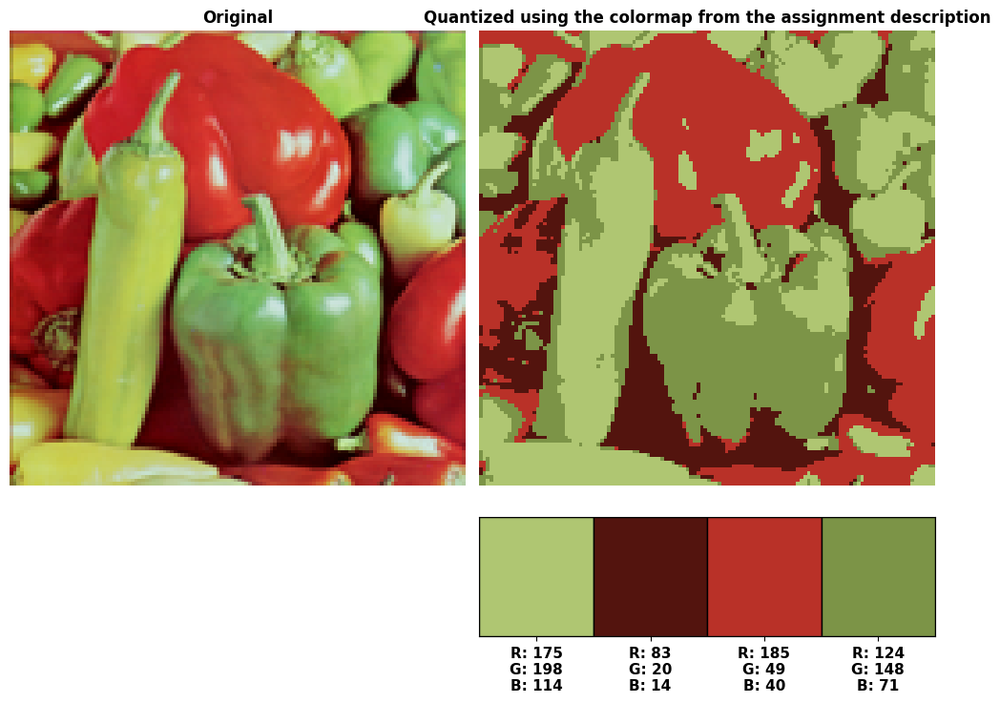

In [287]:
# Colormap from the assignment description
palette = np.array([
        [175,198,114],
        [ 83, 20, 14],
        [185, 49, 40],
        [124,148, 71],
        ], dtype=np.uint8)

# Quantize using the known palette
quantized_img = quantize_image(original_image, palette)
#image_plotter(original_image, original_quantized_image, palette1=None, title2="Original Quantized image")
image_plotter(original_image, quantized_img, palette1=None, palette2=palette, title2="Quantized using the colormap from the assignment description")

# 3.1.2
**Question:**
Finding the optimal color palette for an image can be seen as a clustering problem. How? What would the points and clusters represent?

**Answer:**

Each pixel in the image can be viewed as a data point in 3D (R,G,B).
We want to find K 'cluster centroids' (i.e., the palette colors) such that
the total distance (error) between each pixel and its nearest centroid is minimized.
This directly matches clustering:
 - Points = pixels in RGB space
 - Clusters = color groups (centroids)

# 3.1.3 Implement PSO clustering in order to perform color quantization on an image.

Notes:
 - What would a particle represent?
 - How would you measure the quality or "fitness" of a particle?
 - If the PSOalgorithm takes very long, try a smaller image (for example 128 by 128) or resize your image to a smaller size.


 ## PSO Clustering Algorithm

In [288]:
def fitness_function(particle, pixels):
    """
    Calculates sum-of-squared-distances (SSD) from each pixel to its nearest centroid
    for a given particle.

    particle: shape (K, 3) representing K centroids in RGB
    pixels:    shape (N, 3), with pixel RGB in [0..255]
    returns:  float, the sum of squared distances
    """
    # For each pixel, compute distance to each centroid
    diffs = pixels[:, np.newaxis, :] - particle[np.newaxis, :, :]  # (N, K, 3)
    dists_sq = np.sum(diffs**2, axis=2)                             # (N, K)
    # Nearest centroid per pixel
    min_dists_sq = np.min(dists_sq, axis=1)
    return np.sum(min_dists_sq)

In [289]:

def pso_clustering(
    image,
    K=4,
    num_particles=30, # number of particles in the swarm
    max_iter=50,
    omega=0.7,       # inertia weight (controls forward momentum)
    alpha1=1.5,      # cognitive component (controls individuals behavior)
    alpha2=1.5,      # social component (controls the individuals particle behaviour in regard of the group)
    improvement_tol=1e-2,
    patience=5,
    random_state=None
):
    """
    Runs the PSO algorithm to find K cluster centroids in RGB space that
    minimize the sum of squared distances to the given pixels.

    Stopping criteria:
      1. Max iteration limit (max_iter)
      2. If improvement < improvement_tol for 'patience' consecutive iterations

    Returns:
        g_best_pos : shape (K,3) best (lowest-error) centroids found
        history    : list of dicts, storing iteration info:
                     {
                       'iteration': int,
                       'particle_positions': (num_particles, K, 3),
                       'g_best_pos': (K,3),
                       'g_best_fitness': float
                     }
    """

    # Seed for reproducibility
    if random_state is not None:
        np.random.seed(random_state)

    # Flatten the image into Nx3 pixels
    pixels = image.reshape(-1, 3).astype(float)

    # 1. Initialize particles randomly in [0,255], shape: (num_particles, K, 3)
    particles = np.random.uniform(0, 255, size=(num_particles, K, 3))
    velocities = np.zeros_like(particles)  # same shape as particles

    # Evaluate initial fitness
    fitnesses = np.array([fitness_function(p, pixels) for p in particles])

    # Initialize personal bests
    p_best_positions = particles.copy()
    p_best_fitnesses = fitnesses.copy()

    # Initialize global best
    g_best_idx = np.argmin(p_best_fitnesses)
    g_best_pos = p_best_positions[g_best_idx].copy()
    g_best_fit = p_best_fitnesses[g_best_idx]

    # Store iteration info
    history = []
    history.append({
        'iteration': 0,
        'particle_positions': particles.copy(),
        'g_best_pos': g_best_pos.copy(),
        'g_best_fitness': g_best_fit
    })

    # Variables for the "while not happy" condition
    iteration = 0
    improvement = np.inf
    not_happy = True
    consecutive_small_improvements = 0
    previous_best_fit = g_best_fit

    print(f"Iteration={iteration}, Best Fitness={g_best_fit:.2f}, "
              f"Improvement={improvement:.2f}")

    # 2. Main PSO loop
    while not_happy:
        iteration += 1

        # Update each particle
        for i in range(num_particles):
            # Generate random factors for each centroid dimension
            r1 = np.random.rand(K, 3)
            r2 = np.random.rand(K, 3)

            velocities[i] = (
                omega * velocities[i]
                + alpha1 * r1 * (p_best_positions[i] - particles[i])
                + alpha2 * r2 * (g_best_pos - particles[i])
            )
            particles[i] += velocities[i]
            # Clip to [0..255]
            particles[i] = np.clip(particles[i], 0, 255)

        # Compute new fitnesses
        fitnesses = np.array([fitness_function(p, pixels) for p in particles])

        # Update personal best
        for i in range(num_particles):
            if fitnesses[i] < p_best_fitnesses[i]:
                p_best_positions[i] = particles[i].copy()
                p_best_fitnesses[i] = fitnesses[i]

        # Update global best
        best_idx_this_iter = np.argmin(fitnesses)
        best_fit_this_iter = fitnesses[best_idx_this_iter]
        if best_fit_this_iter < g_best_fit:
            g_best_fit = best_fit_this_iter
            g_best_pos = particles[best_idx_this_iter].copy()

        # Store iteration data
        history.append({
            'iteration': iteration,
            'particle_positions': particles.copy(),
            'g_best_pos': g_best_pos.copy(),
            'g_best_fitness': g_best_fit
        })

        # Print iteration info (optional)
        improvement = previous_best_fit - g_best_fit
        print(f"Iteration={iteration}, Best Fitness={g_best_fit:.2f}, "
              f"Improvement={improvement:.2f}")

        # Check improvement and decide if we are "happy" yet
        if improvement < improvement_tol:
            consecutive_small_improvements += 1
        else:
            consecutive_small_improvements = 0

        # Update for next loop
        previous_best_fit = g_best_fit

        # 3. Evaluate stopping conditions
        if iteration >= max_iter:
            # Condition A: we hit the iteration cap
            not_happy = False
        elif consecutive_small_improvements >= patience:
            # Condition B: improvement too small for too long
            not_happy = False

    # Return the best centroids found and the history
    return g_best_pos.astype(np.float32), history

In [290]:
# Choose K
K = 4

# Run PSO
best_pos, history = pso_clustering(
    original_image,
    K=K,
    num_particles=100,
    max_iter=1000,  # might try fewer or more
    omega=0.7,
    alpha1=0.7,
    alpha2=0.7,
    improvement_tol=1e-2,
    patience=5,
    random_state=42)

Iteration=0, Best Fitness=72818667.04, Improvement=inf
Iteration=1, Best Fitness=50427282.57, Improvement=22391384.47
Iteration=2, Best Fitness=49604417.74, Improvement=822864.83
Iteration=3, Best Fitness=46828225.70, Improvement=2776192.04
Iteration=4, Best Fitness=35800832.77, Improvement=11027392.93
Iteration=5, Best Fitness=35800832.77, Improvement=0.00
Iteration=6, Best Fitness=35407715.46, Improvement=393117.31
Iteration=7, Best Fitness=31865847.45, Improvement=3541868.00
Iteration=8, Best Fitness=29337663.49, Improvement=2528183.97
Iteration=9, Best Fitness=28977244.06, Improvement=360419.42
Iteration=10, Best Fitness=27631250.90, Improvement=1345993.16
Iteration=11, Best Fitness=27394425.96, Improvement=236824.94
Iteration=12, Best Fitness=26957946.18, Improvement=436479.78
Iteration=13, Best Fitness=26589275.72, Improvement=368670.46
Iteration=14, Best Fitness=26565758.07, Improvement=23517.65
Iteration=15, Best Fitness=26094319.46, Improvement=471438.61
Iteration=16, Best Fit

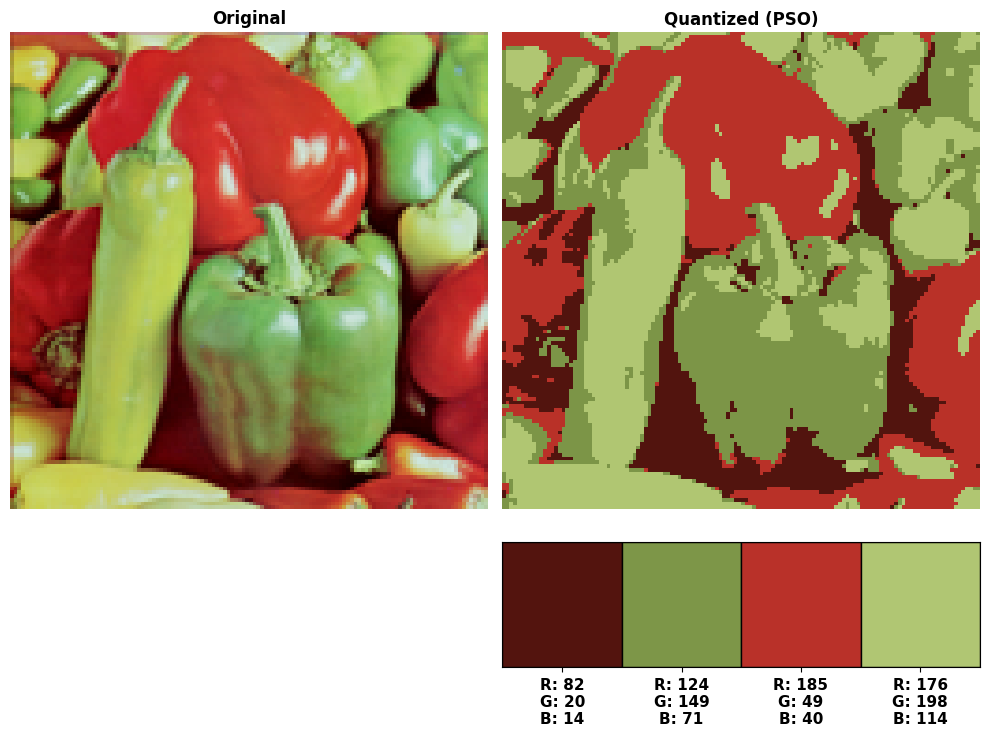

In [291]:
#quantized_image_pso = quantize_image(original_image, best_pos)
best_pos = history[-1]['g_best_pos']
image_plotter(original_image, quantize_image(original_image, best_pos),palette1=None,palette2=best_pos, title1="Original", title2="Quantized (PSO)")

In [306]:
def plot_convergence(history, title="Convergence Plot"):
    """
    Plots the convergence of the PSO algorithm over iterations.

    Args:
        history: List of best fitness values at each iteration.
        title: Title of the plot.
    """
    plt.figure(figsize=(8, 5))
    plt.plot(history, marker="o", linestyle="-", color="b")
    plt.xlabel("Iteration")
    plt.ylabel("Best Fitness Value")
    plt.title(title)
    plt.grid(True)
    plt.show()

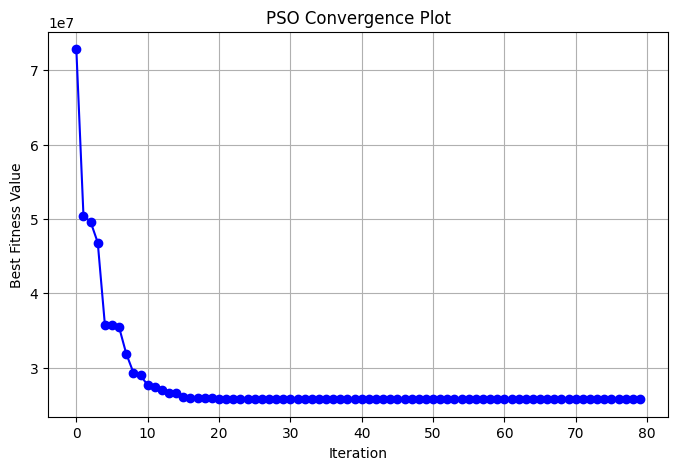

In [307]:
# Extract best fitness values over iterations
fitness_history = [entry['g_best_fitness'] for entry in history]

# Plot the convergence curve
plot_convergence(fitness_history, title="PSO Convergence Plot")


In [308]:
def animate_swarm_2d_colored(swarm_positions, interval=120, projection="RG"):
    """
    Animates the movement of particles in 2D space over iterations, coloring them based on their RGB values.

    Args:
        swarm_positions: NumPy array of shape (iterations, num_particles, 3) representing RGB space.
        interval: Delay between frames in milliseconds.
        projection: Which two color channels to plot ("RG", "RB", or "GB").
    """
    fig, ax = plt.subplots(figsize=(8, 6))

    # Choose which two color channels to plot
    channel_map = {"RG": (0, 1), "RB": (0, 2), "GB": (1, 2)}
    x_idx, y_idx = channel_map.get(projection, (0, 1))  # Default to "RG"

    x_label, y_label = ["Red", "Green", "Blue"][x_idx], ["Red", "Green", "Blue"][y_idx]

    # Extract X and Y values
    swarm_positions_2d = swarm_positions[:, :, [x_idx, y_idx]]

    # Extract colors (Normalize to [0,1] for matplotlib)
    swarm_colors = swarm_positions / 255.0

    # Set axis limits dynamically
    x_min, x_max = np.min(swarm_positions_2d[:, :, 0]), np.max(swarm_positions_2d[:, :, 0])
    y_min, y_max = np.min(swarm_positions_2d[:, :, 1]), np.max(swarm_positions_2d[:, :, 1])

    ax.set_xlim(x_min - 10, x_max + 10)
    ax.set_ylim(y_min - 10, y_max + 10)
    ax.set_xlabel(x_label)
    ax.set_ylabel(y_label)
    ax.set_title(f"Swarm Movement in {projection} Space")

    # Initialize scatter plot
    scatter = ax.scatter(
        swarm_positions_2d[0, :, 0],  # Initial x positions
        swarm_positions_2d[0, :, 1],  # Initial y positions
        c=swarm_colors[0],            # Initial colors
        s=100,                         # Size - a bit larger for visibility
        marker='o',                   # Circle marker
        alpha=0.8                     # Slightly transparent
    )


    def update(frame):
        """Updates the scatter plot for each iteration."""
        ax.set_title(f"Iteration {frame+1}")

        # Update positions
        scatter.set_offsets(swarm_positions_2d[frame])

        # Update colors based on RGB values (normalized)
        scatter.set_color(swarm_colors[frame])
        #scatter.set_color(np.clip(swarm_colors[frame], 0, 1))

        return scatter,

    # Assign animation to prevent garbage collection
    ani = animation.FuncAnimation(fig, update, frames=len(swarm_positions),
                                  interval=interval, repeat=True, blit=False)
    plt.grid(True)
    plt.close(fig)

    return HTML(ani.to_jshtml())

# Extract swarm positions in 3D (RGB space)
swarm_positions_3d = np.array([entry['particle_positions'].reshape(-1, 3) for entry in history])

## Swarm positions RG

In [309]:
# Run the 2D animation with color-based particles
animate_swarm_2d_colored(swarm_positions_3d, projection="RG")  # Use "RB" or "GB" for different projections

## Swarm positions RB

In [310]:
animate_swarm_2d_colored(swarm_positions_3d, projection="RB")

## Swarm positions GB

In [311]:
animate_swarm_2d_colored(swarm_positions_3d, projection="GB")

# 3.1.4
Make sure that at each iteration, your implementation stores the state of the particles and the global best particle. At several iterations of your PSO algorithm, show both the best color palette found so far, and the image quantized with this palette.

In [312]:
def show_all_iterations(image, history, K):
  # Iterate through all iterations in the history
  for it in range(len(history[3])):
    iteration_data = history[it]
    g_best_pos_i = iteration_data['g_best_pos']
    g_best_fit_i = iteration_data['g_best_fitness']

    print(f"Iteration {it} - Fitness={g_best_fit_i:.2f}")

    # Show the quantized image
    quantized_img_i = quantize_image(image, g_best_pos_i)
    image_plotter(image1=quantized_img_i, palette1= g_best_pos_i, title1=f"Quantized image {it}")

In [313]:
def show_several_iterations(image, history, K, iterations_to_show):
  for it in iterations_to_show:
    # If the max_iter < 50, we skip those that don't exist
    if it < len(history):
      iteration_data = history[it]
      g_best_pos_i = iteration_data['g_best_pos']
      g_best_fit_i = iteration_data['g_best_fitness']
      centroids_i = g_best_pos_i.reshape(K,3).astype(np.uint8)

      print(f"Iteration {it} - Fitness={g_best_fit_i:.2f}")

      # Show the quantized image
      quantized_img_i = quantize_image(image, g_best_pos_i)
      image_plotter(image1=quantized_img_i, palette1= g_best_pos_i, title1=f"Quantized image {it}")



In [314]:
# Uncomment to show all iterations
#show_all_iterations(original_image, history, K)

## Show several iterations of the best color palette found so far and the image quantized with this palette.

[ 0 20 40 60 79]
Iteration 0 - Fitness=72818667.04


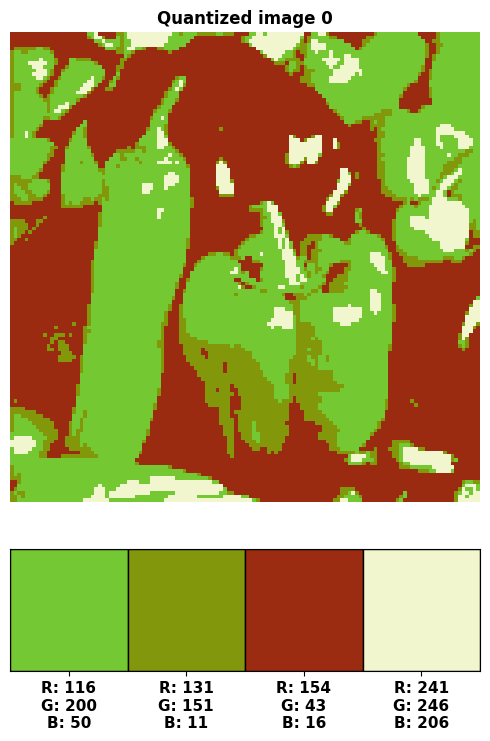

Iteration 20 - Fitness=25805568.97


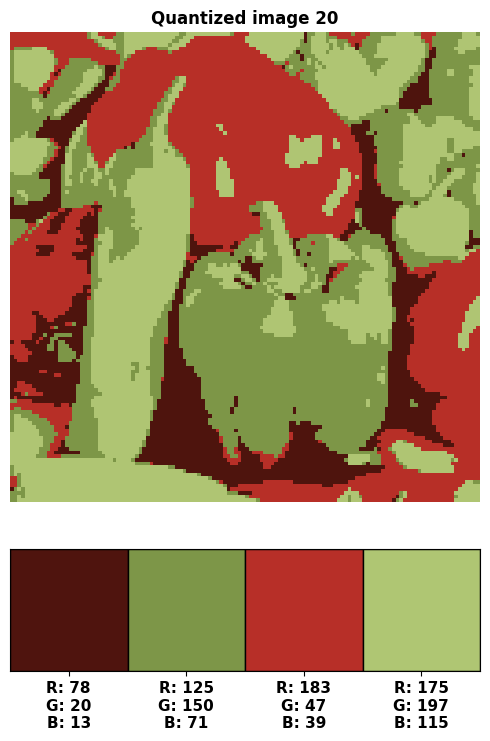

Iteration 40 - Fitness=25760531.48


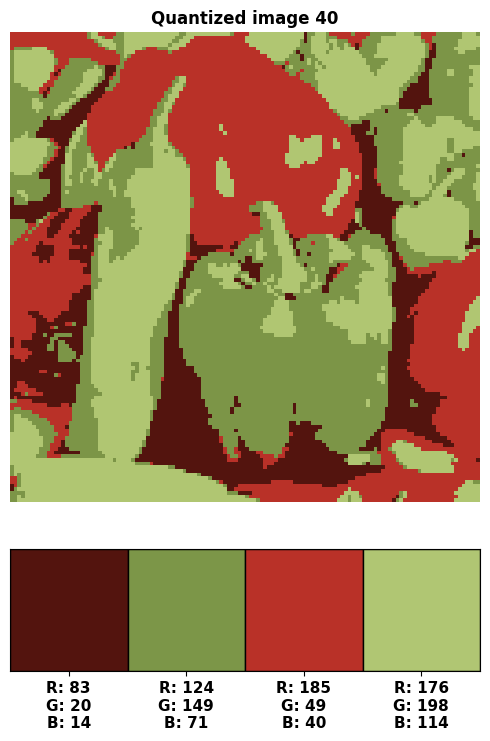

Iteration 60 - Fitness=25760277.39


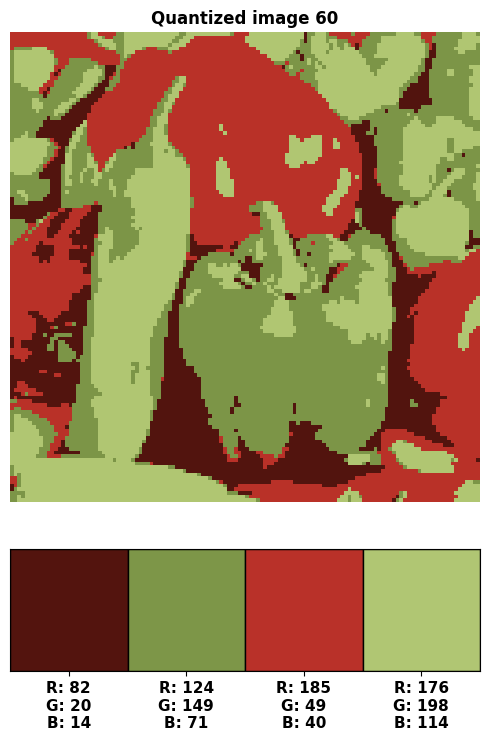

Iteration 79 - Fitness=25760276.37


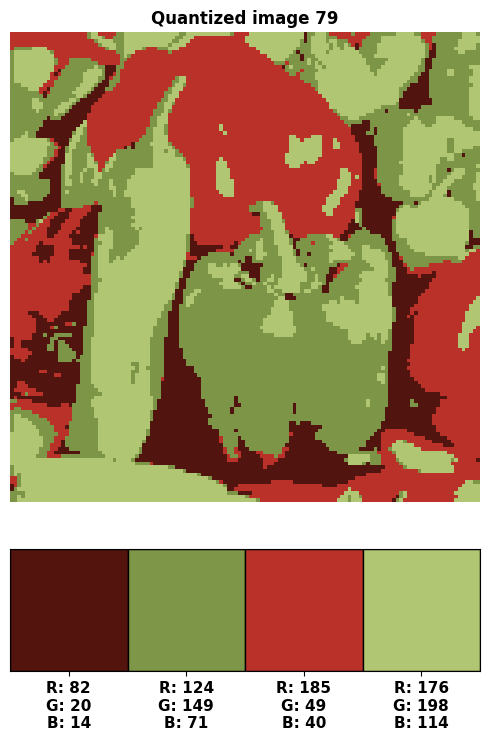

In [315]:
history_length = len(history)

# Create an array with steps of N
n_steps = 20
indexes = np.arange(0, history_length, n_steps)

# Add the last index
if indexes[-1] != history_length - 1:
    indexes = np.append(indexes, history_length - 1)

print(indexes)
show_several_iterations(original_image, history, K, indexes)

# 3.1.5 K-Means
Apopular method for clustering is K-means. Use a K-means implementation to find the best color palette to quantize the image. Compare your results with PSO, which method is better?


In [316]:
def kmeans_palette(image, K=4, random_state=None):
    """
    Fit KMeans to the pixels and return K cluster centers as our palette.
    """
    pixels = image.reshape(-1, 3).astype(np.float32)
    kmeans = KMeans(n_clusters=K, n_init="auto", random_state=42)
    kmeans.fit(pixels)  # shape: (K,3)
    centroids = kmeans.cluster_centers_
    return centroids

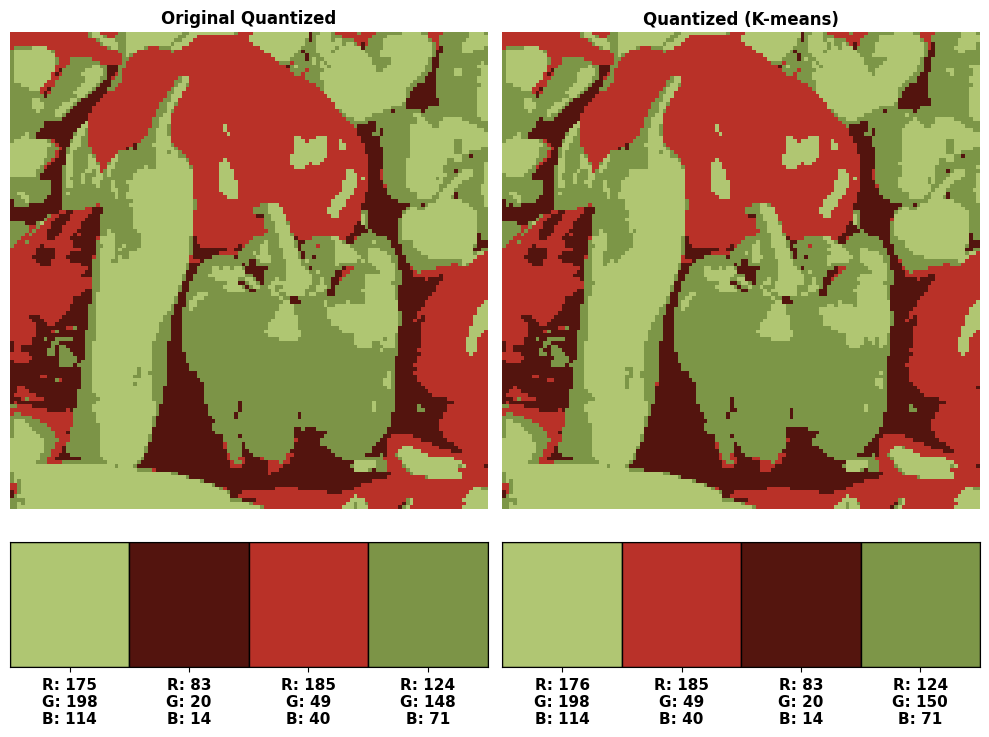

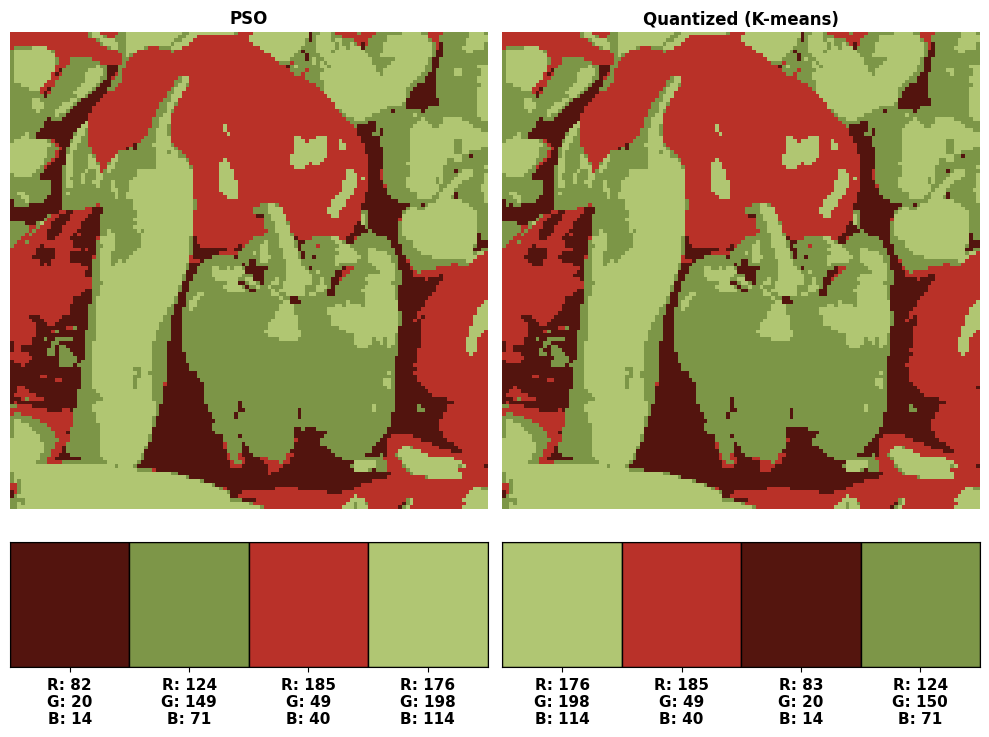

In [317]:
# K-means
centroids_km = kmeans_palette(original_image, K=K, random_state=42)
quantized_img_km = quantize_image(original_image, centroids_km)

#show_palette(centroids_km)
image_plotter(original_quantized_image, quantized_img_km, palette1=palette, palette2=centroids_km, title1="Original Quantized", title2="Quantized (K-means)")

image_plotter(quantize_image(original_image, best_pos), quantized_img_km,best_pos, centroids_km, "PSO", "Quantized (K-means)")

In [335]:
# Compare final SSE (sum of squared errors)
pixels = original_image.reshape(-1, 3).astype(float)
pso_fit = fitness_function(best_pos, pixels)
km_fit = fitness_function(centroids_km.reshape(K, 3), pixels)  # Reshape here
print(f"PSO final fitness:    {pso_fit:.2f}")
print(f"K-Means final fitness: {km_fit:.2f}")

if pso_fit < km_fit:
    print(f"PSO had the minimum fitness: {pso_fit:.2f}")
else:
    print(f"K-Means had the minimum fitness: {km_fit:.2f}")

print(f"Difference:{km_fit - pso_fit}")

PSO final fitness:    25760276.37
K-Means final fitness: 25760614.57
PSO had the minimum fitness: 25760276.37
Difference:338.20096039772034


**The results show that PSO slightly outperform K-means by 338.20**



# Save Quantized images generated by the PSO Clustering Algorithm

In [319]:
def save_pso_quantized_images(image, history, K, directory, output_folder="pso_quantized_images"):
    """
    Saves all quantized images generated by the PSO algorithm to a folder.

    Args:
        image: Original image as a NumPy array.
        history: History of the PSO algorithm (from pso_clustering).
        K: Number of clusters used in PSO.
        directory: Directory to save the images.
        output_folder: Folder to save the images.
    """
    full_path = os.path.join(directory, output_folder)
    print(full_path)
    if not os.path.exists(full_path):
        os.makedirs(full_path)

    for it in range(len(history)):
        iteration_data = history[it]
        g_best_pos_i = iteration_data['g_best_pos']

        quantized_img_i = quantize_image(image, g_best_pos_i)
        file_path = os.path.join(full_path, f"quantized_iteration_k_{K}_{it}.png")
        save_image(quantized_img_i, file_path)

    print(f"All quantized images saved to '{full_path}'")

**Run this code to save the images, change the directory to the desired file path.**

In [320]:
dir = "/content/drive/MyDrive/NaCo/PSO"
save_pso_quantized_images(original_image, history, K, dir)

/content/drive/MyDrive/NaCo/PSO/pso_quantized_images
All quantized images saved to '/content/drive/MyDrive/NaCo/PSO/pso_quantized_images'


# Plot some of the quantized images with color palettes

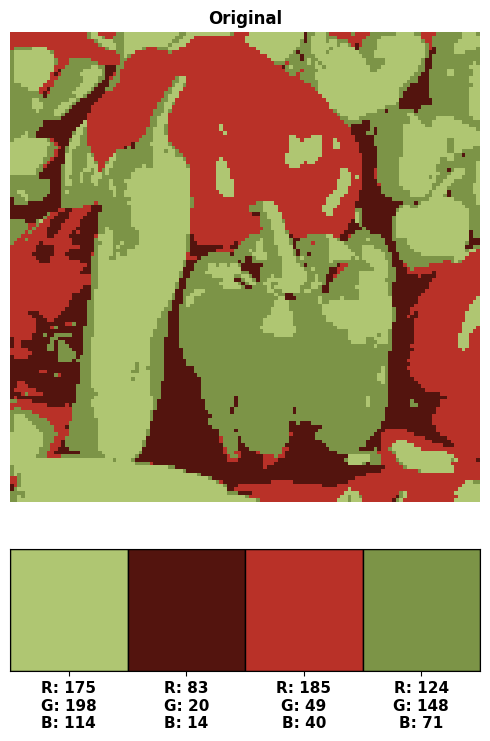

In [321]:
image_plotter(original_quantized_image, palette1=palette, title1="Original")

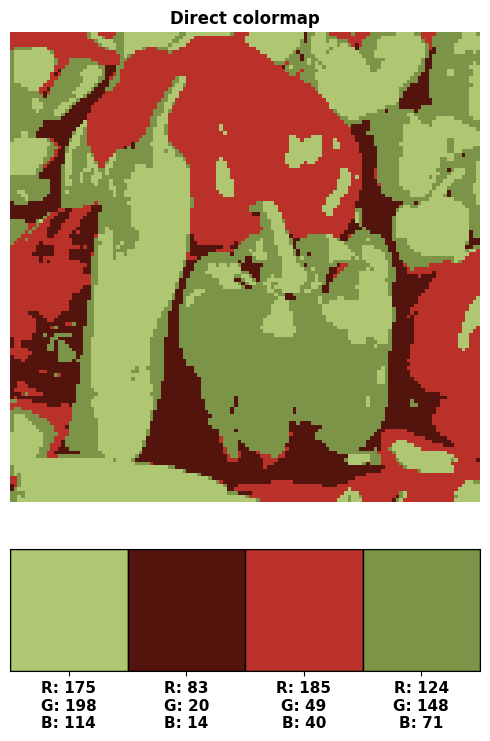

In [322]:
image_plotter(image1=quantize_image(original_image, palette), palette1=palette, title1="Direct colormap")

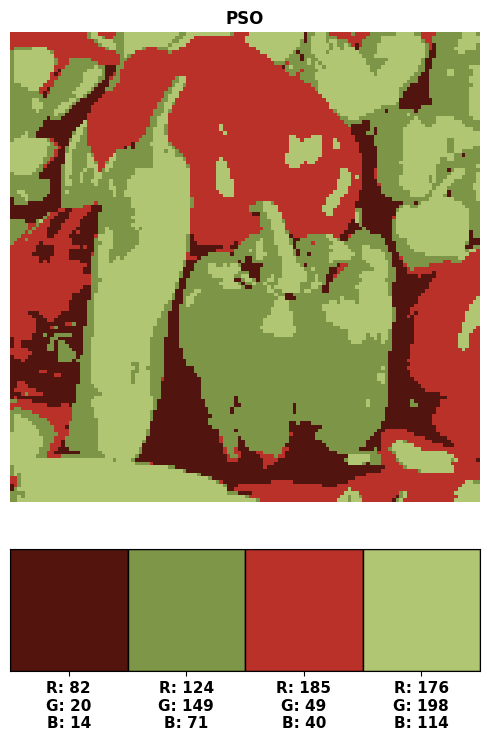

In [325]:
image_plotter(image1=quantize_image(original_image, best_pos), palette1=best_pos, title1="PSO")

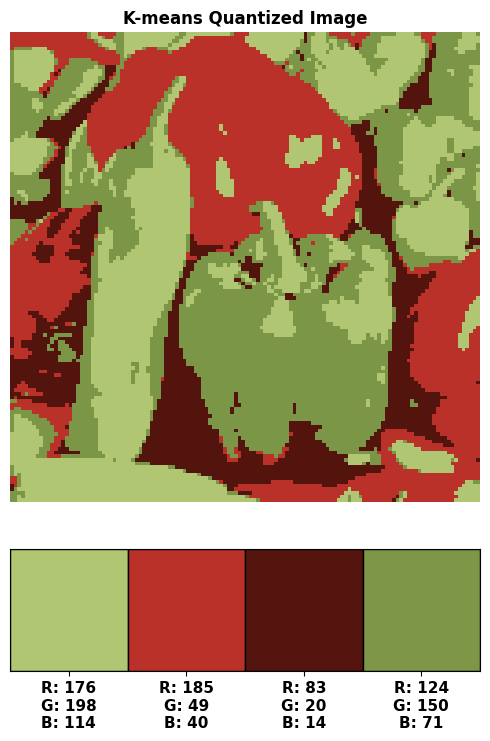

In [324]:
image_plotter(image1=quantize_image(original_image, centroids_km), palette1=centroids_km, title1="K-means Quantized Image")